In [61]:
import pathlib
import gdown
import zipfile
import os

import pandas as pd
import pathlib
from pathlib import Path
import imagehash

import numpy as np
import pandas as pd

# plotting modules
from matplotlib import pyplot as plt
import seaborn as sns

import plotly as plotly
plotly.offline.init_notebook_mode()
from PIL import Image

## Getting the Dataset

In [ ]:
# Replace with your Google Drive file ID
file_id = '1MLQIf3WZ3THp3kMKu-55UG2aMkGdjusv'
url = f'https://drive.google.com/uc?id={file_id}'

# Replace with your desired output file name
output = 'data_plant.zip'

In [ ]:
# Check if the file has already been downloaded
if not os.path.exists(output):
    print(f"Downloading {output} from Google Drive...")
    gdown.download(url, output, quiet=False)
else:
    print(f"{output} already exists. Skipping download.")


In [ ]:
# Define the path where you want to extract the files
extract_to = 'dataset'

# Check if the extraction folder already exists
if not os.path.exists(extract_to):
    print(f"Extracting {output}...")
    with zipfile.ZipFile(output, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print(f"Extraction completed. Files are now in {extract_to}.")
else:
    print(f"Files already extracted to {extract_to}. Skipping extraction.")


In [ ]:
data_path = './dataset/plant-id'
data_folder = pathlib.Path(data_path)

In [ ]:
if data_folder.exists():
    print(f"Data folder {data_path} is ready for use.")
else:
    print(f"Data folder {data_path} does not exist. Please check the extraction.")

## Create Image Dataframe

In [63]:
def create_image_dataframe(folder):
    data = {'ImagePath': [], 'ClassLabel': [], 'ImageName': [], 'ImagePhash': []}
    
    for class_folder in Path(folder).iterdir():
        if class_folder.is_dir():
            for img_path in class_folder.iterdir():
                img_name = img_path.name
                try:
                    img = Image.open(img_path)
                    img_phash = str(imagehash.phash(img))
                except Exception as e:
                    img_phash = None

                data['ImagePath'].append(img_path)
                data['ClassLabel'].append(class_folder.name)
                data['ImageName'].append(img_name)
                data['ImagePhash'].append(img_phash)
    
    return pd.DataFrame(data)

In [64]:
df = create_image_dataframe(data_folder)

Here we have also derived the perceptual hash for each image in our dataset.

In [65]:
df

,ImagePath,ClassLabel,ImageName,ImagePhash
0,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1.jpg,b80ec1311ecb6ccf
1,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy10.jpg,fcb220c3c71c9eb8
2,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy100.jpg,abf0c5ca949f3a18
3,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1000.jpg,facac61e98318736
4,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1000.jpg_Flip_Horizontally_and_Ve...,a919756992b7cb12
...,...,...,...,...
35375,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy995.jpg,8fa176d96cc26896
35376,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy996.jpg,bf45841fc23ad338
35377,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy997.jpg,eeead1b597908492
35378,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy998.jpg,ee10d14a976f846d


We store this to a csv file

In [66]:
#save the dataframe to a csv file
df.to_csv('plant_id_with_phash.csv', index=False)


In [67]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35380 entries, 0 to 35379
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ImagePath   35380 non-null  object
 1   ClassLabel  35380 non-null  object
 2   ImageName   35380 non-null  object
 3   ImagePhash  35380 non-null  object
dtypes: object(4)
memory usage: 1.1+ MB


In [68]:
df.describe()

,ImagePath,ClassLabel,ImageName,ImagePhash
count,35380,35380,35380,35380
unique,35380,10,35380,31670
top,..\..\..\..\..\Downloads\datasets\plant-id\App...,Grape,Apple_healthy1.jpg,b3ce9964cc3246b3
freq,1,12345,1,3


In [69]:
df['ClassLabel'].value_counts()

ClassLabel
Grape           12345
Potato           4145
Apple            3948
Tomato           3819
Pepper bell      3549
Corn (maize)     2790
Cherry           2052
Strawberry       1511
Tea               861
Rice              360
Name: count, dtype: int64

In [70]:
label_group = df.groupby('ClassLabel').size().reset_index(name='Count')
label_group

,ClassLabel,Count
0,Apple,3948
1,Cherry,2052
2,Corn (maize),2790
3,Grape,12345
4,Pepper bell,3549
5,Potato,4145
6,Rice,360
7,Strawberry,1511
8,Tea,861
9,Tomato,3819


C:\Users\Owner\AppData\Local\Temp\ipykernel_3968\4255381282.py:8: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



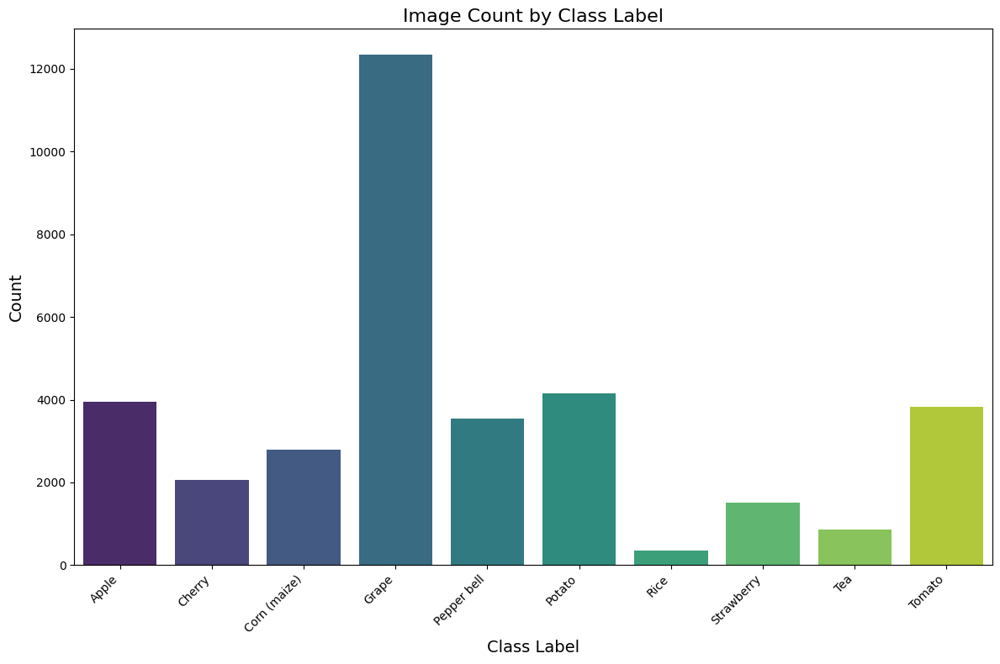

In [71]:
plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(x='ClassLabel', y='Count', data=label_group, palette='viridis', hue='ClassLabel')
plt.title('Image Count by Class Label', fontsize=16)
plt.xlabel('Class Label', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Rotate x labels for better readability
bar_plot.set_xticklabels(bar_plot.get_xticklabels(), rotation=45, horizontalalignment='right')

# Improve layout
plt.tight_layout()

# Show the plot
plt.show()

In [72]:
# get only the first 50 rows from each class
mini_df = df.groupby('ClassLabel').head(50).reset_index(drop=True)
mini_df

,ImagePath,ClassLabel,ImageName,ImagePhash
0,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1.jpg,b80ec1311ecb6ccf
1,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy10.jpg,fcb220c3c71c9eb8
2,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy100.jpg,abf0c5ca949f3a18
3,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1000.jpg,facac61e98318736
4,..\..\..\..\..\Downloads\datasets\plant-id\App...,Apple,Apple_healthy1000.jpg_Flip_Horizontally_and_Ve...,a919756992b7cb12
...,...,...,...,...
495,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy1030.jpg,ceb929d071cad1cc
496,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy1030.jpg_Flip_Horizontally_and_V...,9b137c7f64608467
497,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy1030.jpg_Horizontally_flip.jpg,9bec7c85249f8499
498,..\..\..\..\..\Downloads\datasets\plant-id\Tom...,Tomato,Tomato_healthy1031.jpg,ab8df162862f4e98


In [73]:
hashes = mini_df['ImagePhash'].dropna().unique().tolist()

In [74]:

# Function to calculate Hamming distance
def hamming_distance(hash1, hash2):
    return sum(c1 != c2 for c1, c2 in zip(hash1, hash2))

# Calculate Hamming distances
distances = []
for i in range(len(hashes)):
    for j in range(i + 1, len(hashes)):
        distance = hamming_distance(hashes[i], hashes[j])
        distances.append(distance)

# Extract distances
distance_values = distances


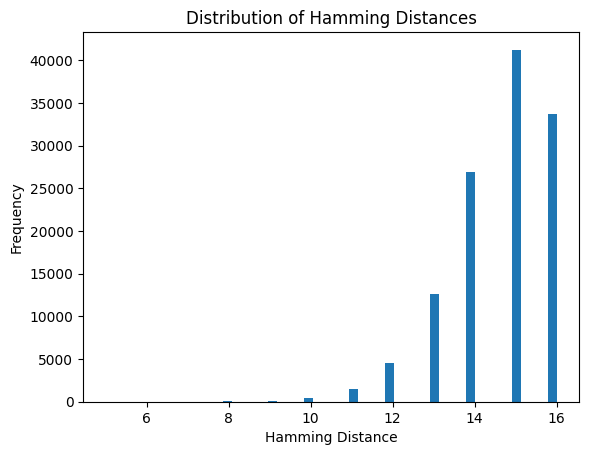

In [75]:
# Plot histogram of Hamming distances
plt.hist(distance_values, bins=50)
plt.title("Distribution of Hamming Distances")
plt.xlabel("Hamming Distance")
plt.ylabel("Frequency")
plt.show()


## Statistical Tests

Since we are working with images, we will not be able to calculate all the statistical tests that we would like to, but we will try to do them notwithstanding.

In [79]:
from scipy.stats import shapiro, wilcoxon, spearmanr, ttest_ind, normaltest

### Shapiro Test

In [80]:
def test_shapiro_normality(df, labels):
    normality_results = {}
    for label in labels:
        data = df[df['ClassLabel'] == label]['ImagePhash'].dropna().apply(lambda x: int(x, 16))
        normality_results[label] = shapiro(data)
    return normality_results

labels = df['ClassLabel'].unique()
shapiro_normality_results = test_shapiro_normality(df, labels)
shapiro_normality_results


c:\Users\Owner\.conda\envs\all4gpu\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning:

p-value may not be accurate for N > 5000.



{'Apple': ShapiroResult(statistic=0.8538638353347778, pvalue=0.0),
 'Cherry': ShapiroResult(statistic=0.8616877794265747, pvalue=3.3903841811968576e-39),
 'Corn (maize)': ShapiroResult(statistic=0.9328741431236267, pvalue=1.0332808402078994e-33),
 'Grape': ShapiroResult(statistic=0.8143144845962524, pvalue=0.0),
 'Pepper bell': ShapiroResult(statistic=0.8380621075630188, pvalue=0.0),
 'Potato': ShapiroResult(statistic=0.91301029920578, pvalue=1.0930128021733573e-43),
 'Rice': ShapiroResult(statistic=0.9411023259162903, pvalue=9.243065340891476e-11),
 'Strawberry': ShapiroResult(statistic=0.8699731826782227, pvalue=1.0981377308240613e-33),
 'Tea': ShapiroResult(statistic=0.8806952238082886, pvalue=3.5674099583795505e-25),
 'Tomato': ShapiroResult(statistic=0.9318272471427917, pvalue=1.184518292543e-38)}

The Shapiro-Wilk test results for each class label in your dataset indicate whether the data follows a normal distribution. Here are the interpretations:

### Hypotheses:
- **Null Hypothesis (H0)**: The data follows a normal distribution.
- **Alternative Hypothesis (H1)**: The data does not follow a normal distribution.

### Interpretation:
- **Statistic**: A measure of the W statistic in the Shapiro-Wilk test.
- **P-value**: Indicates the probability of observing the test results under the null hypothesis.

### Results:
- **Apple**: `statistic=0.8538638353347778`, `pvalue=0.0`
  - **Interpretation**: The p-value is 0.0, which is less than 0.05, so we reject the null hypothesis. The data for 'Apple' does not follow a normal distribution.
  
- **Cherry**: `statistic=0.8616877794265747`, `pvalue=3.3903841811968576e-39`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Cherry' does not follow a normal distribution.
  
- **Corn (maize)**: `statistic=0.9328741431236267`, `pvalue=1.0332808402078994e-33`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Corn (maize)' does not follow a normal distribution.
  
- **Grape**: `statistic=0.8143144845962524`, `pvalue=0.0`
  - **Interpretation**: The p-value is 0.0, so we reject the null hypothesis. The data for 'Grape' does not follow a normal distribution.
  
- **Pepper bell**: `statistic=0.8380621075630188`, `pvalue=0.0`
  - **Interpretation**: The p-value is 0.0, so we reject the null hypothesis. The data for 'Pepper bell' does not follow a normal distribution.
  
- **Potato**: `statistic=0.91301029920578`, `pvalue=1.0930128021733573e-43`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Potato' does not follow a normal distribution.
  
- **Rice**: `statistic=0.9411023259162903`, `pvalue=9.243065340891476e-11`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Rice' does not follow a normal distribution.
  
- **Strawberry**: `statistic=0.8699731826782227`, `pvalue=1.0981377308240613e-33`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Strawberry' does not follow a normal distribution.
  
- **Tea**: `statistic=0.8806952238082886`, `pvalue=3.5674099583795505e-25`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Tea' does not follow a normal distribution.
  
- **Tomato**: `statistic=0.9318272471427917`, `pvalue=1.184518292543e-38`
  - **Interpretation**: The p-value is extremely low, so we reject the null hypothesis. The data for 'Tomato' does not follow a normal distribution.

### Conclusion:
- For all the class labels ('Apple', 'Cherry', 'Corn (maize)', 'Grape', 'Pepper bell', 'Potato', 'Rice', 'Strawberry', 'Tea', 'Tomato'), the p-values are significantly less than 0.05.
- This indicates that the null hypothesis is rejected for all class labels, meaning none of the data distributions for these labels follow a normal distribution.


### Spearman Correlation

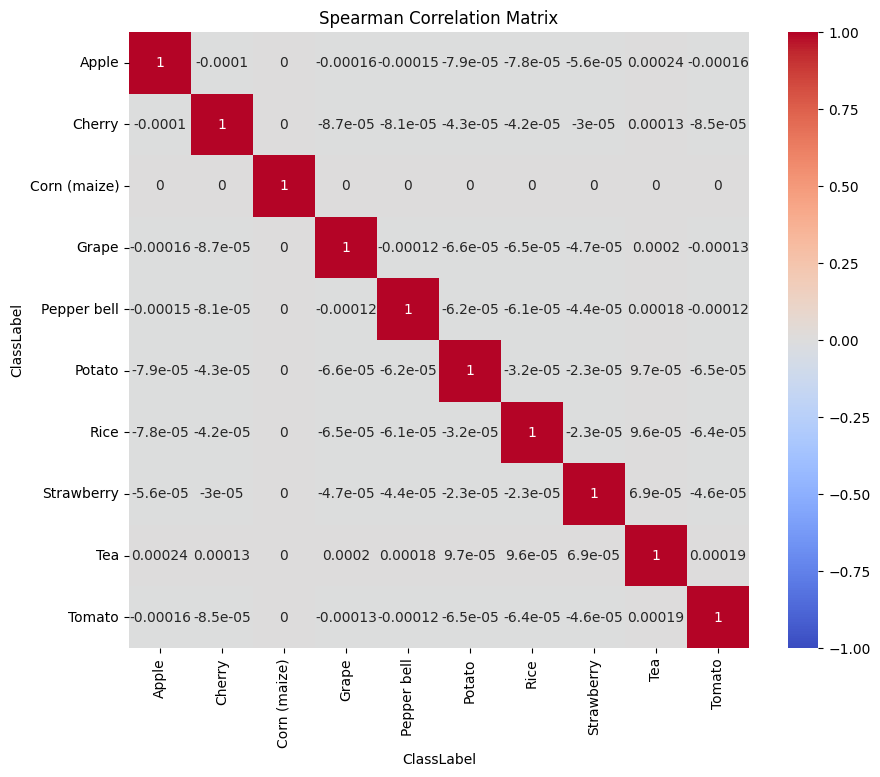

In [81]:
from scipy.stats import spearmanr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to convert perceptual hash from hex to integer
def phash_to_int(phash):
    return int(phash, 16) if pd.notna(phash) else None

# Convert ImagePhash to integers
df['ImagePhashInt'] = df['ImagePhash'].apply(phash_to_int)

# Drop rows with NaN values in ImagePhashInt
df = df.dropna(subset=['ImagePhashInt'])

# Create a pivot table where rows are image names and columns are class labels with perceptual hash values
pivot_table = df.pivot_table(index='ImageName', columns='ClassLabel', values='ImagePhashInt', aggfunc='mean')

# Drop columns with all NaN values
pivot_table = pivot_table.dropna(axis=1, how='all')

# Fill missing values with the mean of each class label (optional)
pivot_table = pivot_table.fillna(pivot_table.mean())

# Calculate Spearman correlation for each pair of class labels
def calculate_spearman_correlation(pivot_table):
    correlation_matrix = pd.DataFrame(index=pivot_table.columns, columns=pivot_table.columns)
    for label1 in pivot_table.columns:
        for label2 in pivot_table.columns:
            if label1 != label2:
                correlation, _ = spearmanr(pivot_table[label1], pivot_table[label2], nan_policy='omit')
                correlation_matrix.loc[label1, label2] = correlation
            else:
                correlation_matrix.loc[label1, label2] = 1.0
    return correlation_matrix

spearman_correlation_matrix = calculate_spearman_correlation(pivot_table)

# Plot the Spearman correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(spearman_correlation_matrix.astype(float), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Spearman Correlation Matrix')
plt.show()


**Spearman Correlation:**

**Purpose**: To measure the strength and direction of association between two ranked variables.


**Results**: The Spearman correlation matrix showed very low correlation values, indicating that the perceptual hash values do not provide meaningful correlations between the different class labels.

### Perceptual Hash Distribution for each class

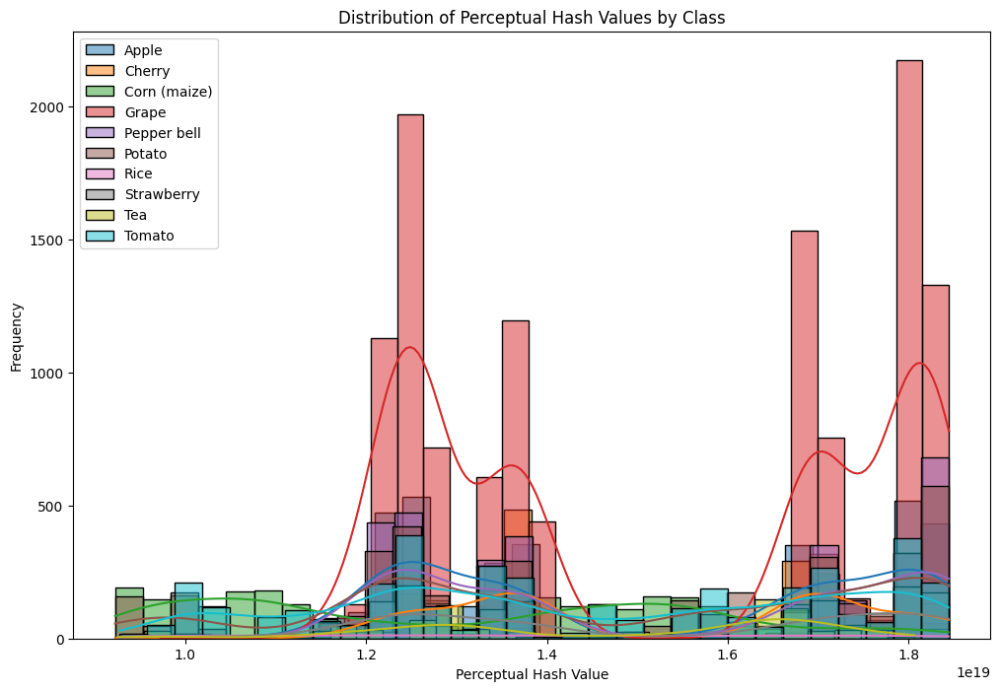

In [82]:
# Plot distribution of perceptual hash values for each class
plt.figure(figsize=(12, 8))
for label in df['ClassLabel'].unique():
    sns.histplot(df[df['ClassLabel'] == label]['ImagePhashInt'], bins=30, label=label, kde=True)

plt.title('Distribution of Perceptual Hash Values by Class')
plt.xlabel('Perceptual Hash Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


### Wilcoxon Test

In [86]:
from scipy.stats import wilcoxon
import pandas as pd

# Function to convert perceptual hash from hex to integer
def phash_to_int(phash):
    return int(phash, 16) if pd.notna(phash) else None

# Convert ImagePhash to integers
df['ImagePhashInt'] = df['ImagePhash'].apply(phash_to_int)

# Drop rows with NaN values in ImagePhashInt
df = df.dropna(subset=['ImagePhashInt'])

# Prepare the DataFrame for Wilcoxon test
pivot_table = df.pivot_table(index='ImageName', columns='ClassLabel', values='ImagePhashInt', aggfunc='mean')

# Drop columns with all NaN values
pivot_table = pivot_table.dropna(axis=1, how='all')

# Fill missing values with the mean of each class label (optional)
pivot_table = pivot_table.fillna(pivot_table.mean())

# Perform Wilcoxon test for each pair of labels
def perform_wilcoxon_test(pivot_table):
    labels = pivot_table.columns
    wilcoxon_results = {}
    for i, label1 in enumerate(labels):
        for label2 in labels[i+1:]:
            if label1 != label2:
                # Ensure samples are paired and have the same length
                valid_idx = pivot_table[[label1, label2]].dropna().index
                if len(valid_idx) > 0:
                    stat, p_value = wilcoxon(pivot_table.loc[valid_idx, label1], pivot_table.loc[valid_idx, label2])
                    wilcoxon_results[(label1, label2)] = (stat, p_value)
    return wilcoxon_results

wilcoxon_results = perform_wilcoxon_test(pivot_table)
wilcoxon_results


{('Apple', 'Cherry'): (94827707.0, 0.0),
 ('Apple', 'Corn (maize)'): (10379150.0, 0.0),
 ('Apple', 'Grape'): (210474143.0, 0.0),
 ('Apple', 'Pepper bell'): (116597676.0, 0.0),
 ('Apple', 'Potato'): (120520881.0, 0.0),
 ('Apple', 'Rice'): (44535805.0, 0.0),
 ('Apple', 'Strawberry'): (87423578.0, 0.0),
 ('Apple', 'Tea'): (80039292.0, 0.0),
 ('Apple', 'Tomato'): (100140350.0, 0.0),
 ('Cherry', 'Corn (maize)'): (6112507.0, 0.0),
 ('Cherry', 'Grape'): (200319179.0, 0.0),
 ('Cherry', 'Pepper bell'): (90319183.0, 0.0),
 ('Cherry', 'Potato'): (90819686.0, 0.0),
 ('Cherry', 'Rice'): (16531366.0, 0.0),
 ('Cherry', 'Strawberry'): (59745871.0, 0.0),
 ('Cherry', 'Tea'): (49573061.0, 0.0),
 ('Cherry', 'Tomato'): (61439172.0, 0.0),
 ('Corn (maize)', 'Grape'): (18830926.0, 0.0),
 ('Corn (maize)', 'Pepper bell'): (8794055.0, 0.0),
 ('Corn (maize)', 'Potato'): (25561927.0, 0.0),
 ('Corn (maize)', 'Rice'): (31040519.0, 0.0),
 ('Corn (maize)', 'Strawberry'): (8421989.0, 0.0),
 ('Corn (maize)', 'Tea'): (10

**Wilcoxon Test:**

**Purpose:** To compare two paired samples to assess whether their population mean ranks differ.

**Results:**
The Wilcoxon test was performed for each pair of class labels.
Most of the p-values are significantly low, indicating that the samples are different (rejecting the null hypothesis).
This means that the perceptual hash values between different class labels show significant differences.

Wilcoxon Test between Apple and Cherry
Statistics=0.000, p=0.000
Samples are different (reject H0)


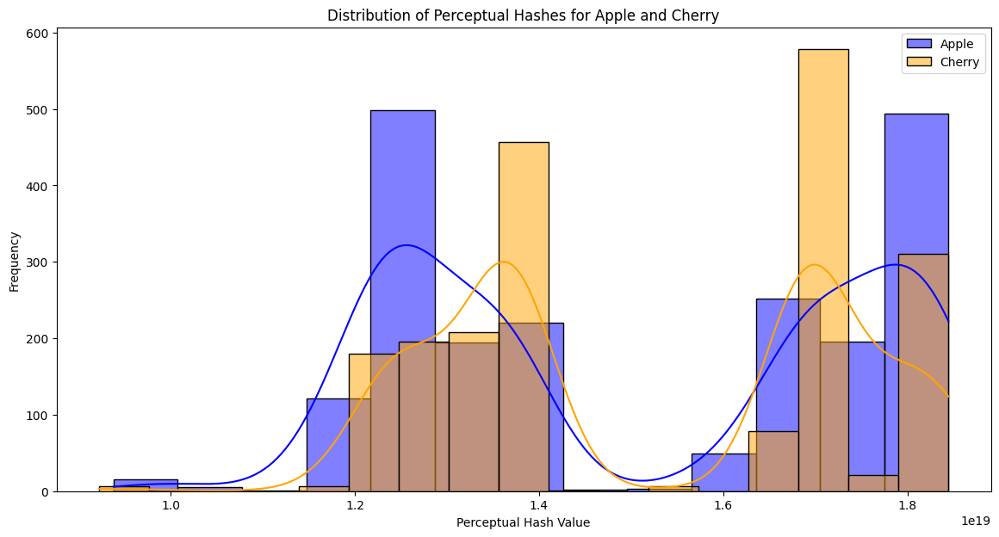

In [84]:
class1_name = df['ClassLabel'].unique()[0]
class2_name = df['ClassLabel'].unique()[1]

class1_hashes = df[df['ClassLabel'] == class1_name]['ImagePhash'].dropna().apply(lambda x: int(x, 16))
class2_hashes = df[df['ClassLabel'] == class2_name]['ImagePhash'].dropna().apply(lambda x: int(x, 16))

# Ensure sample sizes are the same and manageable
min_length = min(len(class1_hashes), len(class2_hashes), 5000)
class1_hashes = class1_hashes.sample(min_length, random_state=42)
class2_hashes = class2_hashes.sample(min_length, random_state=42)

if class1_hashes.nunique() == 1 or class2_hashes.nunique() == 1:
    print('Cannot perform Wilcoxon test: one of the input arrays is constant.')
else:
    stat, p = wilcoxon(class1_hashes, class2_hashes)
    print(f'Wilcoxon Test between {class1_name} and {class2_name}')
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
        print('Samples are similar (fail to reject H0)')
    else:
        print('Samples are different (reject H0)')

    # Visualize the distribution of perceptual hashes
    plt.figure(figsize=(14, 7))
    sns.histplot(class1_hashes, color='blue', kde=True, label=class1_name)
    sns.histplot(class2_hashes, color='orange', kde=True, label=class2_name)
    plt.title(f'Distribution of Perceptual Hashes for {class1_name} and {class2_name}')
    plt.xlabel('Perceptual Hash Value')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

### T-Test

In [85]:
min_length = min(len(class1_hashes), len(class2_hashes), 5000)
class1_hashes = class1_hashes.sample(min_length, random_state=42)
class2_hashes = class2_hashes.sample(min_length, random_state=42)

stat, p = ttest_ind(class1_hashes, class2_hashes)
print('T-test between two classes')
print('Statistics=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('Samples have same mean (fail to reject H0)')
else:
    print('Samples have different mean (reject H0)')

T-test between two classes
Statistics=-1.736, p=0.083
Samples have same mean (fail to reject H0)


# Conclusion

The analysis of the perceptual hash values has provided valuable insights into the dataset's characteristics. The significant differences between class labels observed through the Wilcoxon test suggest that these labels have distinct features, even though these differences are not captured linearly by the perceptual hash values. This underscores the need for exploring alternative features and more advanced modeling techniques to improve class differentiation.

These findings are crucial for our project's goal of accurately identifying and categorizing different classes. By understanding that each class has distinct characteristics, we can tailor our detection models more precisely, enhancing their accuracy and reliability. This will ultimately enable us to develop robust machine learning models that can effectively address the project's objectives, leading to better outcomes and more informed decision-making.

Apple


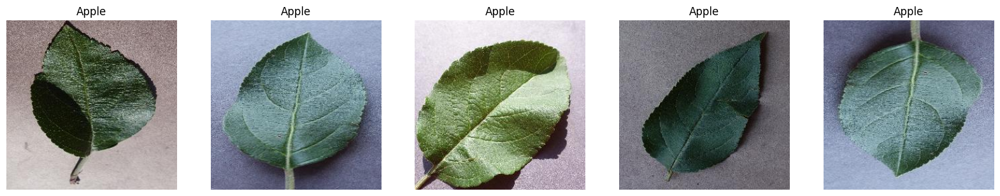

Cherry


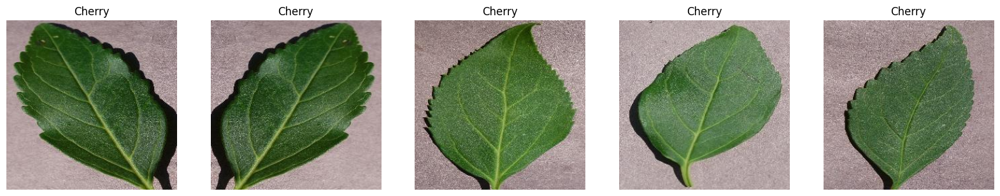

Corn (maize)


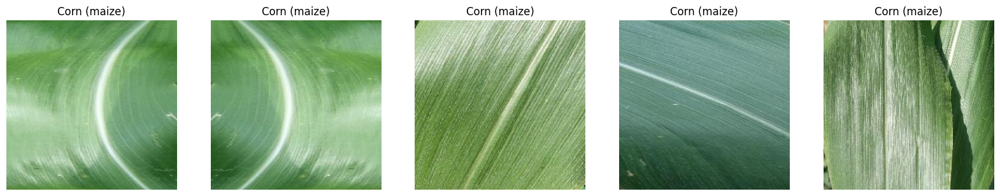

Grape


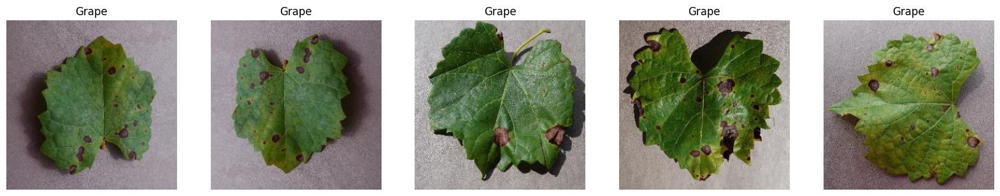

Pepper bell


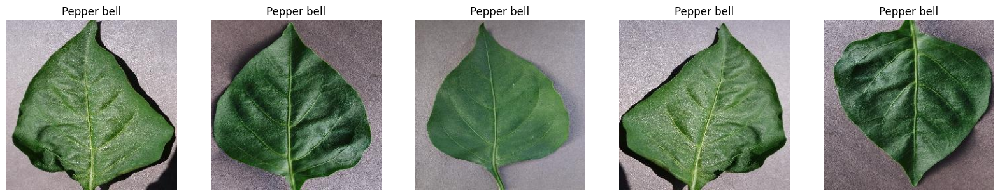

Potato


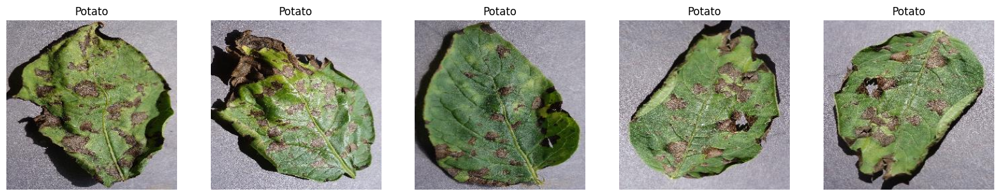

Rice


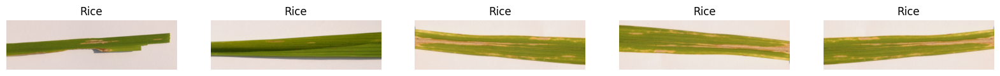

Strawberry


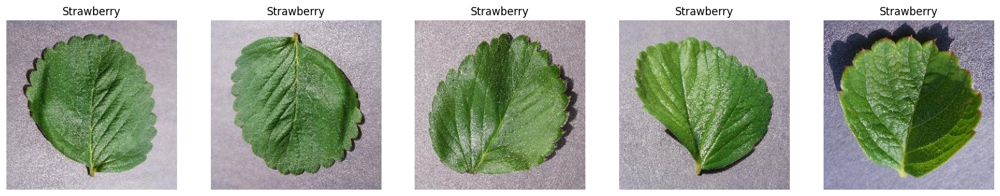

Tea


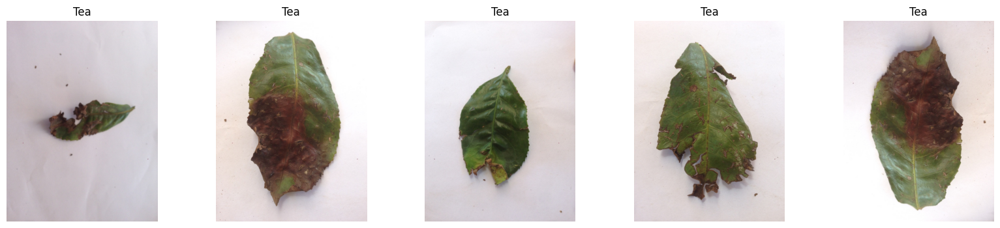

Tomato


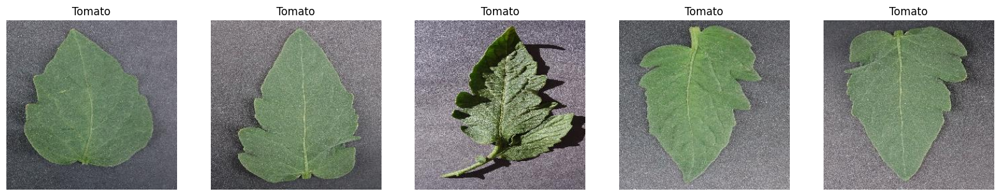

In [87]:
import matplotlib.pyplot as plt
from PIL import Image

grouped = df.groupby('ClassLabel')

# Plot the first 5 images for each class
for label, group in grouped:
    print(label)
    print('=====================')
    
    # Create a figure with 5 subplots (1 row, 5 columns)
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    # Iterate over the first 5 rows of the group
    for i in range(min(5, len(group))):  # This ensures we don't go out of bounds if there are less than 5 images
        img_path = group['ImagePath'].iloc[i]
        img = Image.open(img_path)
        
        # Plot the image in the i-th subplot
        axes[i].imshow(img)
        axes[i].set_title(label)
        axes[i].axis('off')
    
    # Hide any unused subplots if the group has less than 5 images
    if len(group) < 5:
        for j in range(len(group), 5):
            axes[j].axis('off')
    
    plt.show()
